In [7]:
import pandas as pd
import numpy as np

# choose questions only, without lectures, only with basic columns
allDF = pd.read_csv('train-sample.csv')
questionsDF = allDF[allDF.content_type_id == 0]  
questionsDFsmall = questionsDF[['user_id', 'content_id', 'task_container_id', 'answered_correctly']]

questionsDFsmall.to_csv('train-sample-few-columns.csv',index=False)

In [8]:
questionsDFsmall.head()

,user_id,content_id,task_container_id,answered_correctly
0,7171715,3693,4086,1
1,9143398,4727,0,0
2,4980312,1250,493,0
3,15963574,5182,3464,0
4,7305583,4054,1592,1


# What's inside?

Sample contains only 1% of all records.

In [9]:
import seaborn as sns
sns.set_style('darkgrid')

count_of_answers_per_user = questionsDFsmall.user_id.value_counts().rename('answers_per_user')
count_of_answers_per_question = questionsDFsmall.content_id.value_counts().rename('answers_per_question')

### 96% of users in sample answered on fewer than 25 questions

In [10]:
len(count_of_answers_per_user[count_of_answers_per_user < 25]) / len(count_of_answers_per_user) * 100

96.09632887229623

count    189642.0
mean          5.2
std          10.1
min           1.0
25%           1.0
50%           2.0
75%           5.0
max         177.0
Name: answers_per_user, dtype: float64

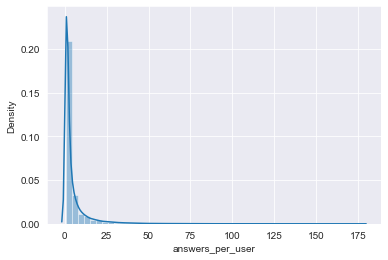

In [16]:
# stats for all users

count_of_answers_per_user.describe().round(1)
sns.distplot(count_of_answers_per_user)

count    182239.0
mean          3.6
std           4.3
min           1.0
25%           1.0
50%           2.0
75%           4.0
max          24.0
Name: answers_per_user, dtype: float64

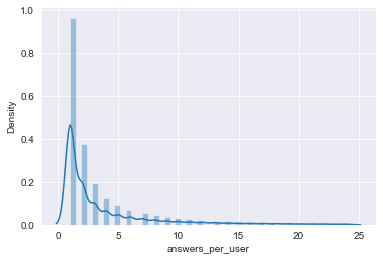

In [17]:
# stats for users with fewer than 25 observations

count_of_answers_per_user[count_of_answers_per_user < 25].describe().round(1)
sns.distplot(count_of_answers_per_user[count_of_answers_per_user < 25])

### 96% of questions in sample has less than 250 answers

In [7]:
len(count_of_answers_per_question[count_of_answers_per_question < 250]) / len(count_of_answers_per_question) * 100

95.91774793231657

count    13179.0
mean        75.3
std        115.6
min          1.0
25%         20.0
50%         49.0
75%         87.0
max       2231.0
Name: answers_per_question, dtype: float64

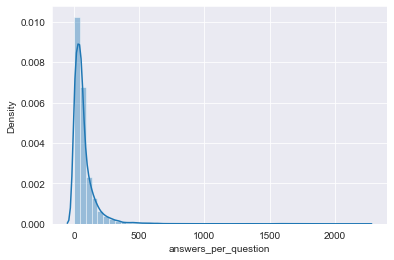

In [8]:
# stats for all questions

count_of_answers_per_question.describe().round(1)
sns.distplot(count_of_answers_per_question)

count    12641.0
mean        59.2
std         51.7
min          1.0
25%         19.0
50%         47.0
75%         79.0
max        249.0
Name: answers_per_question, dtype: float64

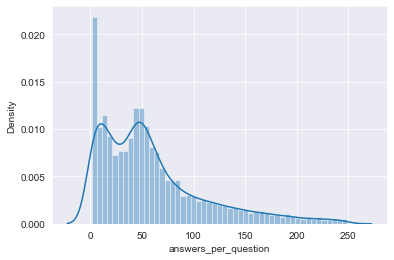

In [9]:
# stats for questions with fewer than 250 observations

count_of_answers_per_question[count_of_answers_per_question < 250].describe().round(1)
sns.distplot(count_of_answers_per_question[count_of_answers_per_question < 250])

### Hardest questions

In [10]:
questionsStats =questionsDFsmall[['content_id','answered_correctly']].groupby('content_id').answered_correctly.agg(['mean', 'count'])
questionsStats.head()

,mean,count
content_id,,
0,0.864407,59
1,0.884615,78
2,0.580574,453
3,0.804762,210
4,0.608069,347


In [11]:
# questions with more than 4 records, x - avg score, y - count of answers registered

meanAndCountFiltered = questionsStats.sort_values(by='mean',ascending=True).query('count > 4')
print("Length: " + str(len(meanAndCountFiltered)))

Length: 11988


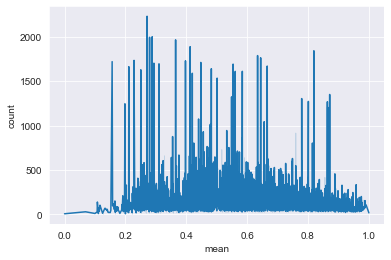

In [12]:
a = sns.lineplot(data=meanAndCountFiltered, x="mean", y="count")

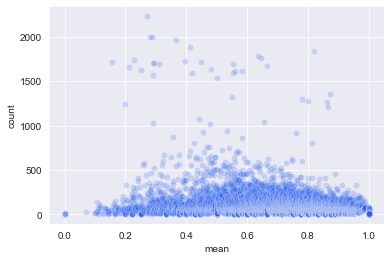

In [13]:
a = sns.scatterplot(data=meanAndCountFiltered, x="mean", y="count",alpha=0.2,color='#285ef0')

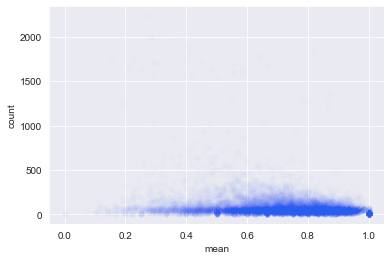

In [14]:
a = sns.scatterplot(data=meanAndCountFiltered, x="mean", y="count",alpha=0.01,color='#285ef0')

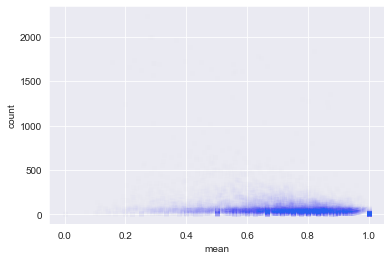

In [15]:
a = sns.scatterplot(data=meanAndCountFiltered, x="mean", y="count",alpha=0.002,color='#285ef0')

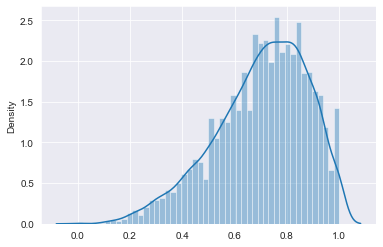

In [16]:
a = sns.distplot(meanAndCountFiltered[['mean']])

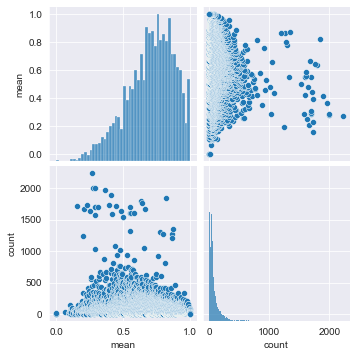

In [17]:
a = sns.pairplot(meanAndCountFiltered)
